# Satellite Dataset Analysis

1. Dataset location (train and test)
2. Visualize spots (do they make sense)

In [1]:
import folium
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import progressbar
import rasterio
import xarray as xr

from shapely.geometry import Polygon
from tqdm.notebook import tqdm
from rasterio.plot import show, reshape_as_image
from branca.element import Figure
from pathlib import Path
from typing import List, Tuple
from xarray.core.dataarray import DataArray

import utils
from data.satellite import SatelliteData, ALL_BANDS
from data.convert_satellite import load_tif, calculate_ndvi


%matplotlib inline 

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# Dataset Distribution

In [3]:
tif_paths = list(Path("../Arizona").glob("*.tif"))
print(f"Total tifs: {len(tif_paths)}")

Total tifs: 1638


In [6]:
def get_coords_from_xarr(xarr: DataArray) -> Tuple[float, float]:
    x,y = [xarr.coords[i].values.mean() for i in ["x", "y"]]
    return y,x

def bbox_from_corners(x_min: float, x_max: float, y_min: float, y_max: float) -> List[Tuple[float, float]]:
    points = [(y_min, x_min), (y_min, x_max), (y_max, x_min), (y_max, x_max)]
    return points

def get_bbox_from_xarr(xarr: DataArray) -> List[Tuple[float, float]]:
    xs, ys = [xarr.coords[i].values for i in ["x", "y"]]
    return bbox_from_corners(xs.min(), xs.max(), ys.min(), ys.max())

def generate_gdf(xarr_list: List[DataArray]) -> gpd.GeoDataFrame:
    X, Y = [], []
    # Record every 10 points into dataframe
    for i in range(0, len(xarr_list), 10):
        y,x = get_coords_from_xarr(xarr_list[i])
        X.append(x)
        Y.append(y)
    gdf = gpd.GeoDataFrame({}, geometry=gpd.points_from_xy(X, Y, crs='EPSG:4326'))
    return gdf

In [7]:
ndvi_bboxes = []
for tif_path in tqdm(tif_paths):
    tif = load_tif(tif_path)
    mean_ndvi_tif = calculate_ndvi(tif).mean()
    bbox = bbox_from_corners(tif.x.values.min(), tif.x.values.max(), tif.y.values.min(), tif.y.values.max())
    ndvi_bboxes.append((mean_ndvi_tif, bbox))

  0%|          | 0/1638 [00:00<?, ?it/s]

In [8]:
color_bboxes = [("green" if ndvi > 0.1 else "yellow", bbox) for ndvi, bbox in ndvi_bboxes]
plot_map(color_bboxes=color_bboxes, zoom_start=9, width=600, height=500)

NameError: name 'plot_map' is not defined

In [ ]:
color_bboxes = [("green", bbox) for ndvi, bbox in ndvi_bboxes if ndvi > 0.1]
plot_map(color_bboxes=color_bboxes, zoom_start=9, width=600, height=500)

In [ ]:
total = len(color_bboxes)
train_set_amount = round(total*0.76)
train_set_amount

In [ ]:
len([bbox for ndvi, bbox in ndvi_bboxes if ndvi > 0.1 and (bbox[0][1] < -114.55)])

In [ ]:
color_bboxes = [("blue" if bbox[0][1] < -114.54 else "orange", bbox) for ndvi, bbox in ndvi_bboxes if ndvi > 0.1]
plot_map(color_bboxes=color_bboxes, zoom_start=9, width=600, height=500)

In [23]:
def get_lat_lon(tif_path):
    da = xr.open_rasterio(tif_path).rename("FEATURES") / 10000
    lat = da.x.values.mean()
    lon = da.y.values.mean()
    return lat,lon

tif_bboxes = []

for i, color in enumerate(["red", "blue", "green"]):
    tif_paths = list(Path("../Arizona").glob(f"{i+1}-*"))
    if len(tif_paths) == 0:
        break
    points = [get_lat_lon(tif_paths[i]) for i in tqdm(range(0, len(tif_paths), 20))]
    X, Y = zip(*points)
    gdf = gpd.GeoDataFrame({}, geometry=gpd.points_from_xy(X, Y, crs='EPSG:4326'))
    bbox = bbox_from_corners(min(X), max(X), min(Y), max(Y))
    tif_bboxes.append((color, bbox))

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

In [24]:
plot_map(color_bboxes=tif_bboxes, zoom_start=9, width=600, height=500)

In [3]:
kwargs = {
    "data_root": "../Arizona-processed3",
    "seq_len": 60,
    "no_randomization": True,
    "bands_to_keep": ALL_BANDS
}
train_data = SatelliteData(train=True, **kwargs)
test_data = SatelliteData(train=False, **kwargs)

Using: 6572 for training
Using: 2728 for testing


In [3]:
# Load data as xarrays instead of tensors so it's easier to work with
# xarrays include coordinate information, all unnormalized bands
train_list = [train_data.get_nc(i) for i in tqdm(range(len(train_data)))]
test_list = [test_data.get_nc(i) for i in tqdm(range(len(test_data)))]

  0%|          | 0/6572 [00:00<?, ?it/s]

  0%|          | 0/2728 [00:00<?, ?it/s]

# Dataset Location

In [6]:
train_gdf = generate_gdf(train_list)
test_gdf = generate_gdf(test_list)
color_gdf_list = [("blue", train_gdf), ("red", test_gdf)]

# Dataset Satellite Location

In [15]:
esri_kwargs = {
    "tiles": "https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    "attr": "Esri",
    "name": "Esri Satellite",
}

def plot_map(
    color_bboxes: List[Tuple[str, List[Tuple[float, float]]]] = None, 
    color_markers: List[Tuple[str, List[Tuple[float, float]]]] = None, 
    zoom_start: int = 15, 
    width: int = 500, 
    height: int = 200,
    map_kwargs=esri_kwargs
) -> Figure:
    if color_bboxes:
        # First bbox is used as center
        first_points = color_bboxes[0][1]
        
    elif color_markers:
        # First point is used as center
        first_points = color_markers[0][1]
        
    else:
        raise ValueError("At least one of color_bboxes or color_markers must be set")
        
    center = list(np.array([p[i] for p in first_points]).mean() for i in [0,1])

    m = folium.Map(location=center, zoom_start=zoom_start, **map_kwargs)
    
    if color_bboxes:
        for color, bbox in color_bboxes:
            folium.Rectangle(bounds=bbox, color=color).add_to(m)
        
    if color_markers:
        feature_group = folium.FeatureGroup('markers')
        for color, markers in color_markers:
            for marker in markers:
                folium.Marker(location=marker, icon=folium.Icon(color=color)).add_to(feature_group)
        feature_group.add_to(m)

    fig = Figure(width=width, height=height)
    return fig.add_child(m)

In [8]:
#train_gdf.geometry.to_list()[0]
def to_points_list(gdf):
    return [(p.y, p.x) for p in gdf.geometry.to_list()]

train_test_markers = [(color, to_points_list(gdf)) for color, gdf in color_gdf_list]
map_kwargs = {"tiles": "cartodbpositron"}
plot_map(color_markers=train_test_markers, zoom_start=7, width=600, height=300, map_kwargs=map_kwargs)

**Why this is useful:** Shows train and test set are split by region. This way the test set is truly an unseen dataset.

In [11]:
def get_bbox_from_gdf(gdf):
    # list of points
    xs = gdf.geometry.map(lambda p: p.x)
    ys = gdf.geometry.map(lambda p: p.y)
    return bbox_from_corners(xs.min(), xs.max(), ys.min(), ys.max())

train_test_bboxes = [(color, get_bbox_from_gdf(gdf)) for color, gdf in color_gdf_list]
plot_map(color_bboxes=train_test_bboxes, zoom_start=9, width=600, height=500)

NameError: name 'color_gdf_list' is not defined

**Why this is useful**: Shows the majority of the dataset goes through desert.

# Visualize Individual Points

In [10]:
def plot_images(images, timesteps=60, cols=12):
    rows = timesteps//cols
    if timesteps%cols != 0:
        rows += 1

    fig, axes = plt.subplots(figsize=(cols*2, rows*2), ncols=cols, nrows=rows)

    for i, img in enumerate(images):
        ax = axes[i//cols][i%cols]
        ax.imshow(img)
        ax.xaxis.set_ticklabels([])
        ax.yaxis.set_ticklabels([])
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])


    months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    for ax, month in zip(axes[0], months):
        ax.set_title(month)

    years = list(range(2016, 2021))
    for ax, year in zip(axes[:,0], years):
        ax.set_ylabel(year, rotation=90, size='large')

    fig.tight_layout()

In [11]:
def plot(tiles: DataArray):    
    imgs = []
    for tile in tqdm(tiles.values):
        colors = train_data.for_viewing(tile, unnormalize=False)
        reshaped = reshape_as_image(colors)
        imgs.append(reshaped)
        
    plot_images(imgs)
    points = get_bbox_from_xarr(tiles)
    fig = plot_map([("green", points)] + train_test_bboxes)
    return fig

  0%|          | 0/60 [00:00<?, ?it/s]

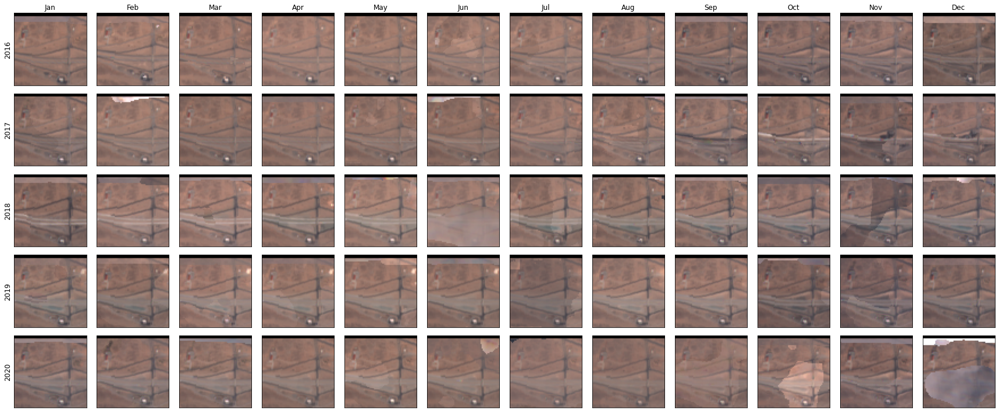

In [12]:
plot(train_list[1])

**Why is this useful:** Shows the location of a single tile on a map and how it changes through time (5 years).

# Visualize Points with most change

In [13]:
def get_sorted_index(sort_by_func, step=10):
    vals = []
    idxs = []
    
    for i in tqdm(range(0, len(train_data), step)):
        std = sort_by_func(train_data.get_nc(i).values)
        vals.append(std)
        idxs.append(i)
    sorted_idxs = np.array(idxs)[np.argsort(-np.array(vals))] 
    return sorted_idxs

In [26]:
def plot_map_with_points(tiles_list, markers=False, color_func=None):
    points = []
    bboxes = []
    for i, tiles in tqdm(enumerate(tiles_list)):
        if color_func:
            color = color_func(i)
        else:
            color = "green"
        bbox = get_bbox_from_xarr(tiles)
        bboxes.append((color, bbox))
        if markers:
            point = get_coords_from_xarr(tiles)
            points.append((color, [point]))


    all_bboxes = train_test_bboxes + bboxes
    fig = plot_map(
        color_bboxes=all_bboxes, 
        color_markers=points, 
        width=800, 
        height=600, 
        zoom_start=9
    )
    return fig
    

In [15]:
sorted_std_index = get_sorted_index(lambda tiles: tiles.std(axis=0).mean())

  0%|          | 0/658 [00:00<?, ?it/s]

In [16]:
tiles_with_highest_std = [train_list[i] for i in sorted_std_index[:100]]
fig = plot_map_with_points(tiles_with_highest_std)
fig

**Why this is useful:** Shows the locations with the most change are the fields and the Colorado river preserve down South.

In [17]:
tiles_with_lowest_std = [train_list[i] for i in sorted_std_index[-100:]]
plot_map_with_points(tiles_with_lowest_std)

**Why this is useful:** Shows the locations with the least change are in the desert.

# Visualize points by NDVI

In [18]:
ndvi_index = ALL_BANDS.index("NDVI")
sorted_ndvi_index = get_sorted_index(lambda tiles: tiles[:, ndvi_index].mean())

  0%|          | 0/658 [00:00<?, ?it/s]

In [19]:
tiles_with_highest_ndvi = [train_list[i] for i in sorted_ndvi_index[:100]]
plot_map_with_points(tiles_with_highest_ndvi)

**Why this is useful:** Shows the locations with the highest NDVI are the fields

In [20]:
tiles_with_lowest_ndvi = [train_list[i] for i in sorted_ndvi_index[-100:]]
plot_map_with_points(tiles_with_lowest_ndvi)

**Why this is useful:** Shows the locations with the lowest NDVI are non fields.

  0%|          | 0/60 [00:00<?, ?it/s]

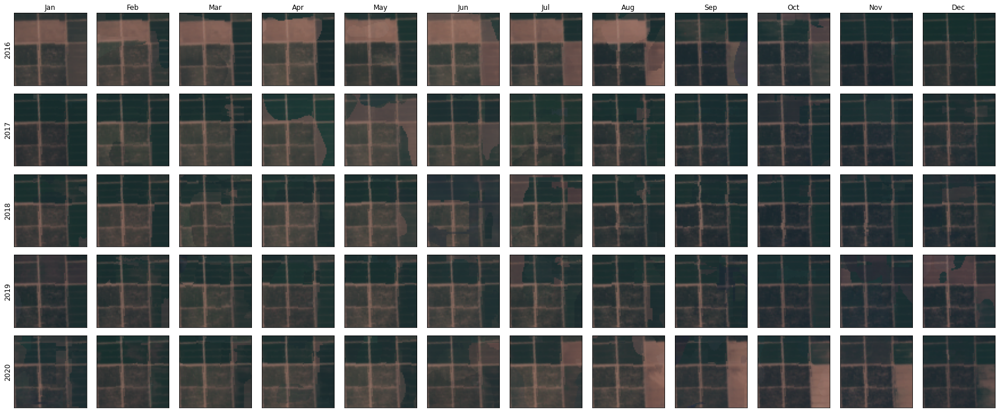

In [21]:
plot(tiles_with_highest_ndvi[0])

**Why this is useful:** Shows an example location with the highest NDVI

# What is the NDVI threshold that separates fields from everything else?

In [23]:
sorted_ndvi_index = get_sorted_index(lambda tiles: tiles[:, ndvi_index].mean(), step=1)

  0%|          | 0/6572 [00:00<?, ?it/s]

In [36]:
tiles_by_ndvi = [train_list[i] for i in sorted_ndvi_index]
threshold_index = 900
plot_map_with_points(tiles_by_ndvi, color_func=lambda i: "green" if i < threshold_index else "orange")

0it [00:00, ?it/s]

**Why this is useful:** Shows that a certain NDVI threshold separates the fields from the non field values.

In [37]:
threshold = tiles_by_ndvi[threshold_index][:, ndvi_index].values.mean()
threshold

0.15016993774253298

## Does it hold up?
0.0-0.1 barren areas of rock, sand, or snow. 
0.2-0.3 shrub and grassland
0.6-0.8 temperate and tropical rainforests 

https://earthobservatory.nasa.gov/features/MeasuringVegetation

Answer: Yes


In [49]:
# Dataset class distribution
train_set_size = len(train_list)
print(f"Fields: {threshold_index / train_set_size:.1%}")
print(f"Non-fields: {(train_set_size-threshold_index) / train_set_size:.1%}")

Fields: 13.7%
Non-fields: 86.3%


**Why is this important:** Only 13.7% of dataset is fields 

# Dataset split by latitude

In [11]:
xs = []
size = len(train_data)
progress = progressbar.ProgressBar(size).start()
for i in range(0, size, 5):
    x = float(train_data.get_nc(i).x[0].values)
    xs.append(x)
    progress.update(i+1)

In [8]:
xs_np = np.array(xs)

In [31]:
# 70% of xs are below this number, use that as the training set
np.percentile(xs_np, 70)

-114.41981012699384